# Basic End-to-End Test

Bobby Pascua, Steven Murray, Nick Kern, Jacob Burba, Josh Dillon, and the HERA Validation Team

## Setup and Metadata

### Abstract

This notebook provides details about how the raw `RIMEz` simulations were modified to optimally match the H1C data, as well as how various sytematic effects were simulated and applied to the raw simulations.

### Imports

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from collections import defaultdict

import copy
import glob
import itertools
import pathlib
import os
import re
import sys

import astropy
from astropy import constants
from astropy import units
from scipy.interpolate import interp1d  # For a hack to select files
import h5py
import yaml

import hera_cal
import hera_pspec
import hera_sim
import pyuvdata
import uvtools

from pyuvdata import UVData, UVBeam, UVCal
from hera_cal import io
from hera_pspec.data import DATA_PATH as PSPEC_DATA_PATH
from uvtools.dspec import gen_window
from uvtools.utils import FFT, fourier_freqs
from uvtools.plot import labeled_waterfall, fourier_transform_waterfalls

sys.path.append(os.path.join(os.getcwd(),"../.."))
import template_tools
import tools

if hera_sim.version.version.startswith('0'):
    from hera_sim.rfi import _listify
else:
    from hera_sim.utils import _listify

/lustre/aoc/projects/hera/rpascua/env/envs/hera/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:22: UserWarning: HealVis failed to import.
  warnings.warn("HealVis failed to import.")
/lustre/aoc/projects/hera/rpascua/env/envs/hera/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:27: UserWarning: PRISim failed to import.
  warnings.warn("PRISim failed to import.")
/lustre/aoc/projects/hera/rpascua/env/envs/hera/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:33: UserWarning: VisGPU failed to import.
  warnings.warn("VisGPU failed to import.")
/lustre/aoc/projects/hera/rpascua/env/envs/hera/lib/python3.7/site-packages/hera_sim/__init__.py:36: FutureWarning: 
In the next major release, all HERA-specific variables will be removed from the codebase. The following variables will need to be accessed through new class-like structures to be introduced in the next major release: 

noise.HERA_Tsky_mdl
noise.HERA_BEAM_POLY
sigchain.HERA_NRAO_BANDPASS
rfi.H

### Description

In [2]:
print(f'Last executed: {str(datetime.now())}')

Last executed: 2021-03-26 02:36:27.115856


- **Major Step Description:** Optimally match raw simulation metadata to H1C IDR2 metadata. Simulate all components of a realistic observation.
- **Minor Variation Description:** 
  - EoR: $P(k) = A_0 k^{-2}$ (amplified, frequency dependent) simulated with `RIMEz`. (ala `0.2.0`)
  - FG: GLEAM + eGSM + brights, simulated with `RIMEz` (ala `1.2.0`)
  - Sky Simulation Format: 
    - Idealized H1C Antenna positions (perfect redundancy)
    - Identical Fagnoni beam applied to each baseline.
    - Full frequency coverage of H1C
    - Times of observation rephased from original LSTs to match 10 chosen days of H1C IDR2.2, for 6 hours per day.
  - Systematics (in order of application):
    - Thermal noise from autocorrelations using `hera_sim`.
    - Gains (linear drift with time, repeating per night) from `hera_sim` (ala `2.1.0`)
    - Cable reflections from `hera_sim` (ala `3.2.0`).
    - Cross-coupling from `hera_sim` (ala `3.2.0`).
  - RFI *flags* applied to post-calibrated data (ala `3.1.0`). Flags drawn from the matched 10 days of actual H1C IDR2.2 data.
- **Pipelines Tested:** `tools.prepare_sim_files`
- **Criteria:** N/A: test criteria appear in notebook test-4.0.0c, in which power spectra are calculated.

### Software

In [3]:
template_tools.print_dep_versions(extras=['astropy', 'hera_cal'], ignore=['healvis'])

Module pyuvdata   ....	Version 1.4.2  .......	Git 6eaa2d32d7656adad3021d221712f47745efce46
Module hera_stats ....	Version 1.4.2  .......	Git 6eaa2d32d7656adad3021d221712f47745efce46
Module hera_sim   ....	Version 0.3.0  .......	Git b"b'3aa6676d11e32acd3850b58b1be737f423f8e841'"
Module hera_qm    ....	Version 1.0    .......	Git 597ec3b498ce1b30cbef2736df1addfc4a6b9ffe
Module hera_pspec ....	Version 0.2.0  .......	Git dad85a51adb57501dc24081cd7ea9687cf512e7c
Module linsolve   ....	Version 0.0.1  .......	Git 
Module uvtools    ....	Version 0.1.0  .......	Git 21d0a953227e95c03274784c052ea5cf3ba5d4cf
Module numpy      ....	Version 1.17.4 .......	Git None
Module healpy     ....	Version 1.12.9 .......	Git None
Module h5py       ....	Version 2.9.0  .......	Git None
Module astropy    ....	Version 4.0.1.post1.......	Git None
Module hera_cal   ....	Version 3.0    .......	Git 1cbb97e41fd59731e3e7df4a4ff9954720f31ca4


### Data

The data directly used in this notebook have been prepared externally by scripts found in this directory (see [Data Preparation](#data-preparation)). To maintain data provenance for the test, we here describe the paths to all relevant data (even data that is not used directly).

The root directory where all validation data lives (on NRAO lustre):

In [4]:
root_path = pathlib.Path("/lustre/aoc/projects/hera/Validation")

The original sky-based simulations (unphased, and compressed to a single baseline per baseline group) are found in the following paths:

In [5]:
data_prefix = 'hera_hex37_100-200MHz_HERA_dipole_'

original_eor_path = root_path / (data_prefix + 'beam_pow_neg2_pspec/realization_0.uvh5')
original_gleam_path = root_path / (data_prefix + 'full_gleam_plus_brights_v01') / 'hera_hex37_full_gleam_plus_brights_v01.uvh5'
original_gsm_path = root_path / (data_prefix + 'eGSM_preview') / 'hera_hex37_egsm_preview.uvh5'

assert original_eor_path.exists()
assert original_gleam_path.exists()
assert original_gsm_path.exists()

print("Base EOR Simulation:\n", original_eor_path)
print("\nBase GLEAM Simulation:\n", original_gleam_path)
print("\nBase eGSM Simulation:\n", original_gsm_path)

Base EOR Simulation:
 /lustre/aoc/projects/hera/Validation/hera_hex37_100-200MHz_HERA_dipole_beam_pow_neg2_pspec/realization_0.uvh5

Base GLEAM Simulation:
 /lustre/aoc/projects/hera/Validation/hera_hex37_100-200MHz_HERA_dipole_full_gleam_plus_brights_v01/hera_hex37_full_gleam_plus_brights_v01.uvh5

Base eGSM Simulation:
 /lustre/aoc/projects/hera/Validation/hera_hex37_100-200MHz_HERA_dipole_eGSM_preview/hera_hex37_egsm_preview.uvh5


Note however that the EoR simulation is amplified by a factor of 10 (in visibility units) and a frequency-dependence applied when creating the chunked files used throughout this notebook.

The files produced by the [data preparation](#data-preparation) are found in the following locations:

In [6]:
test_path = root_path / 'test-4.0.0'
data_path = test_path / 'data'

vis_path = data_path / "visibilities"
gain_path = data_path / "gains"

# Path to beam normalization data
omegas_data_path = root_path / 'HERA_dipole_Omegas/HERA_dipole_Omegas.h5'
assert omegas_data_path.exists()

Within the `visibilities` directory are many files&mdash;one for each time, sky component (`foregrounds` or `sum`), and state of corruption (`true`, `corrupted`). Files with the `true` tag indicate that no systematic effects have been applied, whereas files with the `corrupted` tag have had all systematics applied. The following function retrieves a path corresponding to a query mixing these states (or a list of such files):

In [7]:
def get_vis_files(jd_major='*', jd_minor='*', sky='*', state='*', jd=None):
    if jd:
        jd_major, jd_minor = str(jd).split('.')
        
    assert sky in ("foregrounds", "sum", "eor")
    assert state in ("true", "corrupted")
    
    files = glob.glob(str(vis_path / f"zen.{jd_major}.{jd_minor}.{sky}.{state}.uvh5"))
    if len(files) == 1:
        return files[0]
    else:
        return sorted(files)

Finally, the analysis performed in this test produces some files (mostly spectra) in the following directories:

In [8]:
spec_path = test_path / 'spectra'

## Data Preparation

We begin with three sets of simulation files, compressed by redundancy, located in {{str(vis_path)}}: `eor.uvh5`, `foregrounds.uvh5`, and `sum.uvh5`. `eor.uvh5` contains the visibilities simulated for a $k^{-2}$ power spectrum which have been amplified and given some frequency scaling. `foregrounds.uvh5` contains the sum of the diffuse and point-source foreground visibilities, with the diffuse foreground visibilities using the eGSM and the point-source foreground visibilities using the GLEAM catalog with bright sources added. `sum.uvh5` simply contains the sum of these two sets of visibilities. The original data files used to create these files were produced using the `RIMEz` simulator. We will run three sets of data through the analysis and power spectrum pipeline:
1. Data whose sky component only includes foreground emission, which has been corrupted with simulated systematic effects. (i.e. using `foregrounds.uvh5` and simulating systematics with `hera_sim`.)
2. Data whose sky component includes both foreground emission and mock emission from reionization, which has not been corrupted in any way. (i.e. using `sum.uvh5` and not adding any systematics.)
3. The same as (2), but with systematics added. The systematics will not be identical to the systematics introduced to the data in (1), but will be statistically similar. (i.e. using `sum.uvh5` and simulating systematics with `hera_sim`.)

The precise details of the simulation preparation are a bit more complicated than the above section would suggest. Each of the base simulation files (`eor.uvh5`, `foregrounds.uvh5`, and `sum.uvh5`) will be used to create a set of data similar to the observational data used for the H1C upper-limits paper&mdash;we will be producing the same number of files, modifying the data and metadata from the simulation files to agree with the observing parameters for each good day from H1C IDR2, and simulating all of the systematic effects that we expect to be present in the real data and that we are confident in our ability to simulate in a realistic way.

The first step in the simulation data preparation is adjusting the simulated data/metadata to agree with the observing parameters for each of the chosen days from H1C IDR2, inflating the compressed simulation data, chunking the modified data into files with the same number of integrations as each file in the H1C IDR2 data release, and writing the results to disk. This proceeds as follows:
1. Load in the raw simulation data (one of `eor.uvh5`, `foregrounds.uvh5`, or `sum.uvh5`).
2. Load in the metadata from a given day of observation from H1C IDR2.
3. Perform a downselection in time on the raw simulation data by matching LSTs between the two sets of data.
4. Rephase the downselected simulation data to exactly match the LSTs from the observational data. (Steps (3) and (4) are performed by `tools.sim_prep.interpolate_to_reference`.)
5. Identify and select only a subset of antennas to use from the simulation data and the observational data such that the set of unique baselines for each subset agrees with the other to some tolerance (default 1 meter in each component).
6. Perform a downselection on the simulation data and observational metadata to include only the antennas satisfying (5).
7. Modify the telescope metadata for the simulation data (antenna positions, numbers, and telescope location) such that it agrees exactly with the observational data.
8. Accordingly modify the simulation data array (this is effectively just a re-indexing of the simulation data array). (Steps (5) through (8) are performed by `tools.sim_prep.downselect_antennas`.)
9. Chunk the remaining simulation data into files identical in size to the observational data files and write the results to disk. (This is performed by `tools.sim_prep.chunk_sim_and_save`.)  

All of the above steps are performed by `tools.sim_prep.adjust_sim_to_data`.

For the perfectly calibrated (or, equivalently, uncorrupted) simulation data, no further actions are taken before pushing the data through the validation pipeline. For the corrupted data, we add systematic effects as follows:
1. Using `tools.sim_prep.add_noise`, which effectively wraps `hera_sim.noise.thermal_noise`, simulate thermal noise and add it to the simulation data.
2. Using `tools.sim_prep.add_gains`, which is a thin wrapper for `hera_sim.sigchain.gen_gains`, simulate per-antenna bandpass gains and apply them to the simulation data. Bandpass gains are adjusted to have their amplitude vary linearly in time by 10% over the course of a night.
3. Using `tools.sim_prep.add_reflections`, which wraps `hera_sim.sigchain.gen_reflection_gains`, simulate per-antenna reflection gains and apply them to the data. The reflections are inserted at a delay of about 1200 ns, with some jitter up to about 30 ns, with an amplitude of $10^{-3}$, again with some jitter added, but this time with a standard deviation of one part in $10^4$. Each reflection comes in with a random phase, and all reflections are time-independent over the course of the night (though this is also subject to change).
4. Using `tools.sim_prep.add_xtalk`, which wraps `hera_sim.sigchain.gen_cross_coupling_xtalk`, insert a spectrum of cross-coupling crosstalk into all of the cross-correlation visibilities. The spectrum consists of N crosstalk realizations per visibility, each of which show up at a single delay. By default, we use 10 realizations per baseline which are inserted at delays that are uniformly spaced between 900 and 1300 ns. Each realization of crosstalk has its delay randomized by about 1% (i.e. a realization that is nominally at 900 ns may actually be inserted somewhere between roughly 890 ns and 910 ns). The spectrum of crosstalk for a given baseline is introduced with a log-uniform range of amplitudes from $10^{-4}$ to $10^{-6}$, where the amplitude is a coefficient that scales down the autocorrelation that is broadcast to the cross-correlation. These amplitudes are also given some jitter at the $10^{-4}$ level, practically identical to the way it is done with reflections. Each realization of crosstalk is given a random phase and is inserted symmetrically in delay space.
5. After performing absolute calibration on the corrupted data, RFI flags from the H1C IDR2 data are applied to the calibration solutions.  

For clarity, we may write the final, corrupted visibility as:
$$
\begin{aligned}
V_{ij}^{corrupted} &= (g_ig_j^*)^{bandpass}(g_ig_j^*)^{reflections}V_{ij}^{noisy} \\
&+ (1-\delta_{ij}) |g_i^{bandpass}|^2|g_i^{reflections}|^2V_{ii}^{noisy} \sum_{k=1}^N A_{i,k}\mathrm{e}^{i\phi_{i,k}} \cos(2\pi\nu\tau_{i,k}),
\end{aligned}
$$
where the $i,j$ subscripts refer to antenna numbers, $g_i$ is a complex gain term, and $\delta_{ij}$ is the Kronecker-Delta. Note that the term involving the sum is $V_{ij}^{xtalk}$, and the cosine term ensures that the crosstalk is symmetric in delay space. $V_{ij}^{noisy}$ is modeled as follows: first, define a frequency-dependent contribution to the visibility from the receiver temperature, $V_{ij}^{rx}$ (in principle, this should vary between antennas, but the current version of `tools.sim_prep.add_noise` does not implement that); add this term to the true visibility $V_{ij}^{true}$; divide the sum by the square root of the product of the channel width and the integration time $\sqrt{Bt_{int}}$; then do an element-wise multiplication of the resulting visibility waterfall with a similarly sized matrix whose entries are Gaussian random in their real and imaginary components. We may write this as 
$$
V_{ij}^{noisy} = V_{ij}^{true} + \delta_{ij}V_{ij}^{rx} + (1 - \delta_{ij})N_{ij}\frac{V_{ij}^{true} + V_{ij}^{rx}}{\sqrt{Bt_{int}}}, 
$$
where $N_{ij}$ is the complex noise realization for the given baseline $\vec{b}_{ij}$. The $\delta_{ij}$ terms ensure that the autocorrelations receive a noise bias and that they remain purely real-valued (perhaps also worth noting is that the autocorrelations only have a receiver temperature added and no noise&mdash;this is OK, considering that the autocorrelations' high SNR ($\sim 1000$) effectively makes them noiseless). It is important to stress that $N_{ij}$ is uncorrelated in time and frequency, each baseline's noise realization is independent from every other baseline's noise realization, and noise is uncorrelated between polarizations.

In [9]:
# choose H1C files
idr2path = root_path.parent / "H1C_IDR2"
idr2_2path = idr2path / "IDR2_2"
bad_days = (2458104, 2458105, 2458109)
obs_days = [
    obsdir for obsdir in os.listdir(idr2path) 
    if obsdir not in bad_days and obsdir.startswith('245')
]
idr2_2_days = [
    obsdir for obsdir in os.listdir(idr2_2path)
    if obsdir not in bad_days and obsdir.startswith('245')
]

obs_day_dirs = [idr2path / obsdir for obsdir in obs_days]
idr2_2_obs_day_dirs = [idr2_2path / obsdir for obsdir in idr2_2_days]

obs_files = {
    obsdir.name : [str(obsdir / obsfile) for obsfile in os.listdir(obsdir) 
                   if obsfile.endswith('uvh5')]
    for obsdir in obs_day_dirs
}
obs_files = {
    obsday : sorted(file_glob) for obsday, file_glob in obs_files.items() 
    if file_glob != []
}
idr2_2_obs_files = {
    obsdir.name : [str(obsdir / obsfile) for obsfile in os.listdir(obsdir)
                   if obsfile.endswith('.HH.uvh5')]
    for obsdir in idr2_2_obs_day_dirs
}
idr2_2_obs_files = {
    obsday : sorted(file_glob) 
    for obsday, file_glob in idr2_2_obs_files.items() 
    if file_glob != []
}
smoothcal_idr2_2_files = {
    obsday : [obsfile for obsfile in obsdir if obsfile.endswith('smooth_abs_vis.uvh5')]
    for obsday, obsdir in idr2_2_obs_files.items()
}

In [10]:
# Used for troubleshooting when iterating on simulating effects.
# This cell writes the simulated gains to disk in a calfits file.
write_gains = False
if write_gains:
    # write the true gains to disk
    sim_obsdirs = sorted(glob.glob(str(vis_path / "245*")))
    jd_major_pattern = re.compile('[0-9]{7}')
    for obsdir in sim_obsdirs:
        jd = jd_major_pattern.findall(obsdir)[0]
        #if jd != '2458108': continue 

        # Get a glob of files for one of the sims and read the metadata.
        vis_files = sorted(glob.glob(os.path.join(obsdir, "*.uvh5")))
        sum_files = [f for f in vis_files if 'sum.true' in f]
        uvd = UVData()
        uvd.read(sum_files)
        times = np.unique(uvd.time_array)
        freqs_GHz = np.unique(uvd.freq_array) / 1e9
        ants = uvd.get_ants()

        # Get the configuration files. Only need one for each type.
        config_files = glob.glob(os.path.join(obsdir, "*.yaml"))
        sum_config = list(f for f in config_files if 'sum' in f)[0]
        fg_config = list(f for f in config_files if 'foregrounds' in f)[0]

        # Write the gains to disk for each simulation.
        for config_file, cmp in zip((sum_config, fg_config), ('sum', 'foregrounds')):
            with open(config_file, 'r') as cfg:
                config = yaml.load(cfg.read(), Loader=yaml.FullLoader)
            gain_params = config['gains']
            uvd, gains = tools.sim_prep.add_gains(uvd, ret_cmp=True, **gain_params)
            x_gains = {(ant, 'Jnn') : gain for ant, gain in gains.items()}
            y_gains = {(ant, 'Jee') : gain for ant, gain in gains.items()}
            gains = {}
            gains.update(x_gains)
            gains.update(y_gains)
            fname = str(gain_path / f'{jd}.{cmp}.true_gains.calfits')
            cal = hera_cal.io.write_cal(
                fname, gains, np.unique(uvd.freq_array), times, overwrite=True
            )

            # Now write the reflections to disk
            refl_spec_params = config["reflection_spectrum"]
            reflection_params = config["reflections"]
            uvd, refl_spec = tools.sim_prep.add_reflection_spectrum(uvd, ret_cmp=True, **refl_spec_params)
            uvd, reflections = tools.sim_prep.add_reflections(uvd, ret_cmp=True, **reflection_params)
            gains = {
                ant: gain * reflections[ant] for ant, gain in refl_spec.items()
            }
            x_gains = {(ant, 'Jnn') : gain for ant, gain in gains.items()}
            y_gains = {(ant, 'Jee') : gain for ant, gain in gains.items()}
            gains = {}
            gains.update(x_gains)
            gains.update(y_gains)
            fname = str(gain_path / f"{jd}.{cmp}.reflections.calfits")
            cal = hera_cal.io.write_cal(
                fname, gains, np.unique(uvd.freq_array), times, overwrite=True
            )

In [11]:
# make the RIMEz beam model
bm_file = os.path.join(tools.__path__[0], "data/RIMEz_beam_poly.npy")
if not os.path.exists(bm_file):
    with h5py.File(omegas_data_path, 'r') as f:
        omega_p = f['Omega'][()]
        use_freqs = f['frequency_samples_hz'][()]
    deg = hera_sim.noise.HERA_BEAM_POLY.size - 1
    bm_poly = np.polyfit(use_freqs / 1e9, omega_p, deg)
    if not os.path.exists(bm_file):
        np.save(bm_file, bm_poly)

## Extra Utility Functions

Some of these may be unnecessary, but they have been useful in previous Tests.

In [12]:
H0 = 67.74
h = H0/100.

cosmo = hera_pspec.conversions.Cosmo_Conversions(
    Om_L=0.6911,
    Om_b=0.02230/h**2,
    Om_c=0.1188/h**2,
    H0=H0,
)

In [13]:
# get a Vokes-I uvdata object from the input uvh5 file
def get_VI_data(vis, flag_nchan_low=50, flag_nchan_high=50):
    # choose only data that hasn't been flagged, assuming 1024 frequency channels
    chans = np.arange(1024)[flag_nchan_low:-flag_nchan_high]
    
    if isinstance(vis, str):
        uvd = UVData()
        uvd.read_uvh5(vis_data_path, freq_chans=chans, keep_all_metadata=False)
    else:
        uvd = vis
        
    # one of these days...
    xx_integer = pyuvdata.utils.polstr2num('xx')
    yy_integer = pyuvdata.utils.polstr2num('yy')
    
    xx_ind = np.argwhere(uvd.polarization_array == xx_integer)[0][0]
    yy_ind = np.argwhere(uvd.polarization_array == yy_integer)[0][0]
    
    VI_data = uvd.data_array[:,:,:,xx_ind] + uvd.data_array[:,:,:,yy_ind]
    
    uvd.select(polarizations=(-5))
    uvd.polarization_array[0] = 1
    uvd.data_array = VI_data.reshape(VI_data.shape + (1,))
    
    return uvd

In [14]:
def plot_spectra(uvp_avgs, labels, blps, spws=[0], polpair=('pI', 'pI'),
                 fig=None, ax=None, linestyles=None, linewidths=None,
                 colors=None, alpha=0.5, figsize=(10, 7)):
    
    # Expects a list of averaged uvps and the label/name of each
    assert len(uvp_avgs) == len(labels)
    
    # Set up defaults for plotting
    if linestyles is None:
        linestyles = ['-'] * len(uvp_avgs)
    if linewidths is None:
        linewidths = [3.5] * len(uvp_avgs)
    if colors is None:
        colors = ['k'] * len(uvp_avgs)
    
    ax_arg = True
    if ax is None:
        fig, ax = plt.subplots(len(blps), len(spws), sharex='col', sharey='row', figsize=figsize)
        ax_arg = False
        
    for i in range(len(blps)):
        for j in range(len(spws)):
            key = (spws[j], blps[i], polpair)
            freq_range = uvp_avgs[0].get_spw_ranges(spws[j])[0][:2]
            
            k_paras = uvp_avgs[0].get_kparas(spws[j])
            analytic_spectrum = get_analytic_spectrum(uvp_avgs[0], spws[j])            
                                   
            # Set up for plotting
            # Deal with cases when there is only one subplot, one spw, or one baseline pair
            # First make sure that if there was an axis passed, we use it
            if ax_arg:
                ax_plot = ax
            # Otherwise, deal with the cases of only having one subplot, one row, and/or one column
            else:
                if len(fig.get_axes()) == 1:
                    ax_plot = ax
                elif len(blps) == 1:
                    ax_plot = ax[j]
                elif len(spws) == 1:
                    ax_plot = ax[i]
                else:
                    ax_plot = ax[i, j]
            
            # Actually plot the spectra
            ax_plot.loglog(k_paras, np.abs(analytic_spectrum), ls=':', lw=2, color='#3F3F3F',
                           alpha=0.75, label='Analytic EoR')
            for k in range(len(uvp_avgs)):
                uvp_plot = uvp_avgs[k].get_data(key)
                ax_plot.loglog(k_paras, np.abs(uvp_plot[0]), ls=linestyles[k], lw=linewidths[k],
                               color=colors[k], alpha=alpha, label=labels[k])

            ax_plot.set_xlabel(r'$k_\parallel$ [$h$ Mpc$^{-1}$]', fontsize=16)
            ax_plot.set_ylabel(r'Power [mK$^2$ $h^{-3}$ Mpc$^3$]', fontsize=16)
            ax_plot.set_title('spw: {:0.0f} - {:0.0f} MHz; '.format(freq_range[0] / 1e6, freq_range[1] / 1e6) +
                              'blp: {}; pol: {}'.format(key[1], key[2]), fontsize=14)
            ax_plot.legend(fontsize=12)

In [15]:
# this may need to be updated; check with Jacob re: test-3.1.0
def get_pspec(pspec_file):
    psc = hera_pspec.container.PSpecContainer(pspec_file, keep_open=False)
    uvp = psc.get_pspec(psc.groups()[0])[0]
    return uvp

In [16]:
def get_k_nyquist(uvp, spw=0):
    keys = uvp.get_all_keys()
    dly = uvp.get_dlys(spw)
    
    if dly.size % 2 == 0:
        tau_nyquist = np.amax(dly)
    else:
        ddly = np.diff(dly)[0]
        tau_nyquist = np.amax(dly) + ddly/2.

    spw_freqs = uvp.freq_array[uvp.spw_freq_array == spw]
    z_mean = uvp.cosmo.f2z(np.mean(spw_freqs))

    return np.amax(tau_nyquist)*uvp.cosmo.tau_to_kpara(z_mean, little_h=True)

def aliased_power_spectrum(k, k_nyquist, z, freq_dep=False):
    A0 = 1e1 * (1./0.2)**-2.
    Pk = 1e6 * A0 * (np.pi)**2. * 1./(2. * k_nyquist * np.sin(np.pi*k /(2*k_nyquist)))**2
    
    if freq_dep:
        # assume we're working with the power spectrum w/ frequency-scaled amplitude
        # so follow the steps in the 0.2.0 notebook
        
        # frequency of HI line at the source
        f21_emit = 1420.4057517667 # MHz
        
        # redshifted 21-cm line
        f21_obs = f21_emit/(1 + z)
        
        # scale the power spectrum by an overall factor of 10000
        # (visibilities are scaled by a factor of 100)
        # also apply frequency dependence
        Pk *= 100**2 * (100 / f21_obs)**6
        
    return Pk * cosmo.h / (1 + z)**2

def get_analytic_spectrum(uvp, spw, freq_dep=False):
    # Get redshift of band center for scaling the aliased spectrum
    freq_range = uvp.get_spw_ranges(spw)[0][:2]
    center = (freq_range[0] + freq_range[1]) / 2
    z = 1420405751.7667 / center - 1
    k_paras = uvp.get_kparas(spw)
    k_nyquist = get_k_nyquist(uvp, spw=spw)
    
    return aliased_power_spectrum(k_paras, k_nyquist, z, freq_dep)

In [17]:
def plot_avg_spectra(spectra_avg, analytic, resid=False, xlim=None, ylim=None):
    # for now, let's only plot the abscal, smoothed abscal, simple cal, and true power spectra
    colors = ['#DA4E3B', '#3D5789', '#270B52']
    alphas = (0.5, 0.6, 0.6)

    linestyles = ('-', ':', '--', '-', '-', '-')
    lws = (4, 4, 4, 6, 6, 6)

    # bundle these up into a tuple of things to be iterated over
    plot_iterator = lambda : zip(spec_to_plot.values(), labels, colors, alphas, linestyles, lws)

    # create a figure and axes objects
    fig = plt.figure(figsize=(15, 5.8 * Nspws))
    axes = fig.subplots(Nspws)

    # setup stuff
    for j in range(Nspws):
        ax = axes[j]
        if xlim:
            ax.set_xlim(xlim)
        if ylim:
            ax.set_ylim(ylim)
        ax.grid(b=True, which="major", axis="y")
        ax.grid(b=True, which="both", axis="x")
        fmin, fmax = spw_edges[j]
        ax.set_title("A Collection of Spectra, All Baseline Pairs\n" + \
                      "Spectral Window: {:4.1f} MHz to {:4.1f} MHz".format(fmin/1e6, fmax/1e6),
                      fontsize=12)

        ax.set_xlabel(r"$k_\parallel$ [$h$ Mpc$^{-1}$]", fontsize=12)
        
        
        ax.set_xscale('log')
        if not resid:
            ax.set_ylabel(r"Power [mK$^2$ $h^{-3}$ Mpc$^3$]", fontsize=12)
            ax.set_yscale('log')
        else:
            ax.set_ylabel(r"Fractional Residual Power", fontsize=12)
            
    # plot all the ("measured") things    
    for spw, kparallel in enumerate(k_paras):
        ax = axes[spw]
        
        for (label, spec), color, alpha, ls, lw in zip(spectra_avg.items(), colors, alphas, linestyles, lws):
            
            if resid:
                ax.plot(kparallel, (np.abs(spec[spw]['average']) - analytic[spw])/analytic[spw], lw=lw, ls=ls, color=color, alpha=alpha, label=label)
                ax.axhline(0, lw=2, color='k')
            else:
                ax.plot(kparallel, np.abs(spec[spw]['average']), lw=lw, ls=ls, color=color, alpha=alpha, label=label)
        
        if not resid:
            ax.plot(kparallel, analytic[spw], color='k', lw=4, ls='--', alpha=0.3, label="expected")
            
        ax.legend(ncol=2)

        

    plt.tight_layout()

In [18]:
def _get_array_dict(uvd, recenter=False):
    antpos, ants = uvd.get_ENU_antpos()
    if recenter:
        antpos -= antpos.mean(axis=0)
    return dict(zip(ants, antpos))

In [19]:
def update_array_plot(ax, antpos, number_ants=True, dx=1, dy=1,
                ant_label='', array_label='', **kwargs):
    if isinstance(antpos, UVData):
        antpos = _get_array_dict(antpos, kwargs.pop('recenter', False))
    label_array = bool(array_label)
    for ant, pos in antpos.items():
        x, y, z = pos
        if label_array:
            kwargs['label'] = array_label
            label_array = False
        ax.plot(x, y, **kwargs)
        _ = kwargs.pop('label', None)
        if number_ants:
            ax.text(x + dx, y + dy, f"{ant_label}{ant}")
    return

In [20]:
def plot_array(uvd, recenter=True, **kwargs):
    if isinstance(uvd, UVData):
        uvd = [uvd,]
    Naxes = len(uvd)
    figsize = kwargs.pop('figsize', (7*Naxes, 5))
    fig = plt.figure(figsize=figsize)
    for count, this_uvd in enumerate(uvd):
        # figure setup stuff
        axes_id = (1, Naxes, count + 1)
        ax = fig.add_subplot(*axes_id)
        ax.set_xlabel("East-West Position [m]", fontsize=12)
        ax.set_ylabel("North-South Position [m]", fontsize=12)
        update_array_plot(ax, this_uvd, recenter=recenter, **kwargs)     
    return fig

## Data Exploration with a Single File

In this section, we explore and investigate the performance of the tools in the `sim_prep` module.

In [21]:
sim_files = sorted(
    glob.glob(os.path.join(vis_path, "2458098/zen.*.sum.true.uvh5"))
)
sim_file = sim_files[0]
vis_file = vis_path / "sum.uvh5"

In [22]:
sim_uvd = UVData()
sim_uvd.read(sim_file)

Telescope RIMEz calculation is not in known_telescopes.


In [23]:
# choose one of the IDR2 files to use
ref_uvd = UVData()
ref_uvd.read(list(obs_files.values())[0][0], read_data=False)

In [24]:
# load in the original simulation file metadata
base_sim_uvd = UVData()
base_sim_uvd.read(vis_file, read_data=False)

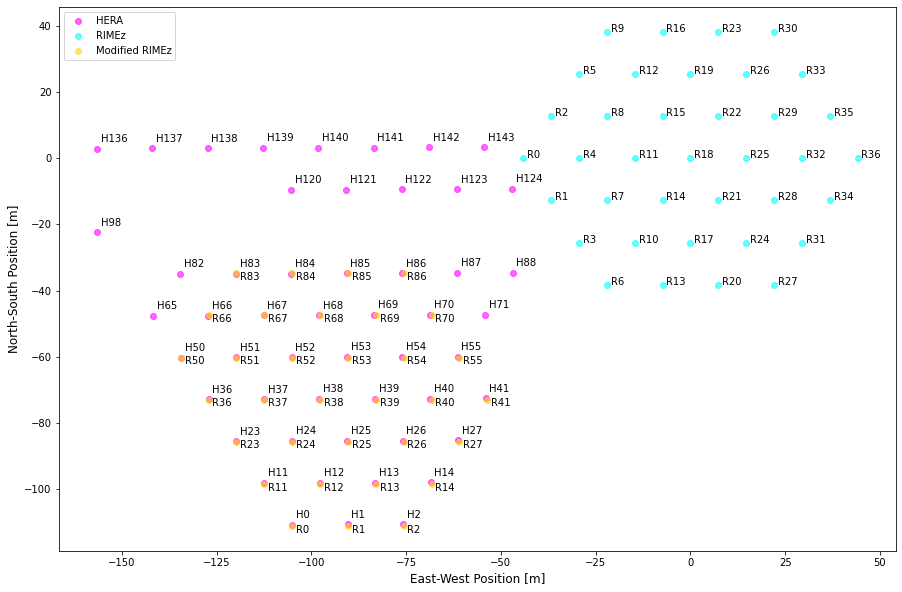

In [25]:
# all on the same plot
plot_kwargs = {'marker' : 'o', 'dx' : 1, 'alpha' : 0.6, 'lw' : 0}
fig = plot_array(
    ref_uvd, recenter=False, figsize=(15,10), dy=2, color='magenta',
    ant_label='H', array_label='HERA', **plot_kwargs
)
ax = fig.axes[0]
update_array_plot(
    ax, base_sim_uvd, recenter=False, dy=0, color='cyan', ant_label='R', 
    array_label='RIMEz', **plot_kwargs
)
update_array_plot(
    ax, sim_uvd, recenter=False, dy=-2, color='gold', ant_label='R',
    array_label='Modified RIMEz', **plot_kwargs
)
_ = ax.legend(loc='upper left')

**Figure 1 |** Plot showing the HERA H1C array (magenta), the original RIMEz array (cyan), and the subset of the RIMEz array used for this validation test (gold). Note that the antenna positions and numbers from the modified RIMEz array exactly match those for the subset of the HERA H1C antennas being used.

In [26]:
# check that data is redundant and nonzero
sim_antpos = _get_array_dict(sim_uvd)
sim_reds = hera_cal.redcal.get_pos_reds(sim_antpos)
for reds in sim_reds:
    combos = itertools.combinations(reds, 2)
    for combo in combos:
        bl1, bl2 = combo
        assert np.allclose(sim_uvd.get_data(bl1), sim_uvd.get_data(bl2))
        assert not np.allclose(sim_uvd.get_data(bl1), 0)

In [27]:
# check how many redundant baselines we keep
base_sim_antpos = _get_array_dict(base_sim_uvd)
h1c_antpos = _get_array_dict(ref_uvd)
base_sim_reds = hera_cal.redcal.get_pos_reds(base_sim_antpos)
h1c_reds = hera_cal.redcal.get_pos_reds(h1c_antpos)
Nreds_kept = len(sim_reds)
f_remain_h1c = int(100 * Nreds_kept / len(h1c_reds))
f_remain_rimez = int(100 * Nreds_kept / len(base_sim_reds))
print(f"{f_remain_h1c}% of H1C unique baselines remain.")
print(f"{f_remain_rimez}% of RIMEz unique baselines remain.")
print(f"{Nreds_kept} unique baselines remain.")

44% of H1C unique baselines remain.
88% of RIMEz unique baselines remain.
56 unique baselines remain.


In [28]:
# check that redcal works
cal_path = str(data_path / "calibrations")
cal = hera_cal.redcal.redcal_run(
    sim_file, outdir=str(cal_path), clobber=True
)
for gain_type in ('g_firstcal', 'g_omnical'):
    for gains in cal[gain_type].values():
        assert np.allclose(gains, 1)

Telescope RIMEz calculation is not in known_telescopes.


File exists; clobbering


In [29]:
# check that abscal works
cal_file = sim_file.replace('.uvh5', '.omni.calfits')
cal_file = cal_file.replace('visibilities', 'calibrations')
cal_file = cal_file.replace('/2458098','')
hc = hera_cal.abscal.post_redcal_abscal_run(
    sim_file, cal_file, [sim_file], clobber=True
)
assert np.allclose(hc.gain_array, 1)

The following model files overlap with data files in LST:
/lustre/aoc/projects/hera/Validation/test-4.0.0/data/visibilities/2458098/zen.2458098.26719.sum.true.uvh5


Telescope RIMEz calculation is not in known_telescopes.




Now calibrating ee-polarization...
Selected 528 data baselines and 528 model baselines to load.

    Now calibrating times 2458098.2672558525 through 2458098.2745881174...
...configuring linsolve data for abs_amp_logcal
...running linsolve
...finished linsolve
...configuring linsolve data for delay_slope_lincal
...running linsolve
...finished linsolve
...configuring linsolve data for delay_slope_lincal
...running linsolve
...finished linsolve
...configuring global_phase_slope_logcal for the dft algorithm
...configuring global_phase_slope_logcal for the dft algorithm
...configuring global_phase_slope_logcal for the linfit algorithm
...running linsolve
...finished linsolve
global_phase_slope_logcal convergence criterion: 2.417395278575469e-13
...configuring global_phase_slope_logcal for the linfit algorithm
...running linsolve
...finished linsolve
global_phase_slope_logcal convergence criterion: 1.7179368884098495e-17
...configuring linsolve data for TT_phs_logcal
...running linsolve
.

Telescope RIMEz calculation is not in known_telescopes.


...configuring linsolve data for abs_amp_logcal
...running linsolve
...finished linsolve
...configuring linsolve data for delay_slope_lincal
...running linsolve
...finished linsolve
...configuring linsolve data for delay_slope_lincal
...running linsolve
...finished linsolve
...configuring global_phase_slope_logcal for the dft algorithm
...configuring global_phase_slope_logcal for the dft algorithm
...configuring global_phase_slope_logcal for the linfit algorithm
...running linsolve
...finished linsolve
global_phase_slope_logcal convergence criterion: 2.417370947387496e-13
...configuring global_phase_slope_logcal for the linfit algorithm
...running linsolve
...finished linsolve
global_phase_slope_logcal convergence criterion: 1.924520565399679e-17
...configuring linsolve data for TT_phs_logcal
...running linsolve
...finished linsolve
TT_phs_logcal convergence criterion: 3.093584008850105e-14


In [30]:
del cal, hc, base_sim_uvd, ref_uvd, sim_uvd

In [31]:
sim_files = sorted(
    glob.glob(os.path.join(vis_path / '2458098', "zen.*.sum.*.uvh5"))
)
config_files = glob.glob(
    os.path.join(vis_path / '2458098', '*config*.yaml')
)
corrupt_files = [f for f in sim_files if 'corrupt' in f]
true_files = [f for f in sim_files if 'true' in f]

In [32]:
# load in the simulation data
start, stop = 20, 40
sim_uvd = UVData()
sim_uvd.read(true_files[start:stop], axis='blt')
sim_antpos = _get_array_dict(sim_uvd)

Telescope RIMEz calculation is not in known_telescopes.


In [33]:
# uncalibrating the data; first, let's choose some baseline and look at the visibilities
blx = 0
while blx > -30:
    antpairpols = [
        antpairpol for antpairpol in sim_uvd.get_antpairpols()
        if antpairpol[0] != antpairpol[1]
    ]
    use_antpairpol = antpairpols[np.random.randint(len(antpairpols))]
    ai, aj, pol = use_antpairpol
    # check out the orientation of the baseline
    baseline = sim_antpos[aj] - sim_antpos[ai]
    blx = baseline[0]
print(use_antpairpol, baseline)

(14, 66, 'ee') [-5.87999992e+01  5.09222947e+01  2.99736545e-06]


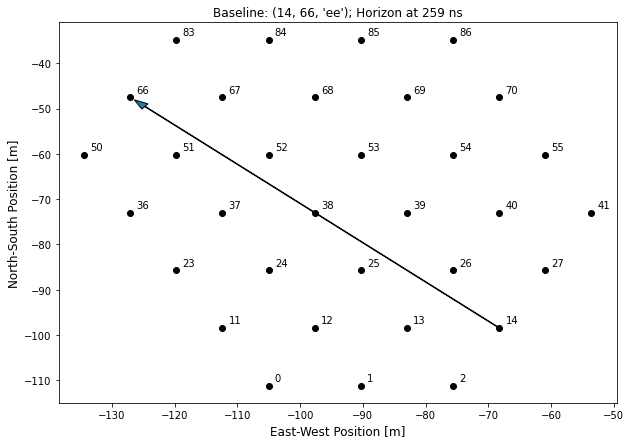

In [34]:
fig = plot_array(sim_uvd, marker='o', color='k', figsize=(10,7), recenter=False)
ax = fig.axes[0]

# get parameters for plotting the baseline
xi, yi, zi = sim_antpos[ai]
dx, dy, dz = baseline

# get the geometric horizon to note in the title
horizon = np.linalg.norm(baseline) / constants.c.value * 1e9 # ns

# make sure that the arrow showing the baseline looks reasonable
tail_width = 0.1
head_width = tail_width * 15
f = 0.96

# actually plot the arrow showing the baseline, as well as the title
_ = ax.arrow(xi, yi, f * dx, f * dy, width=tail_width, head_width=head_width)
_ = ax.set_title(
    f"Baseline: {use_antpairpol}; Horizon at {int(horizon)} ns", fontsize=12
)

**Figure 2 |** Antenna array showing which baseline is chosen for visualizing visibilities in the following plots.

In [35]:
bl_vec_string = "(" + " m, ".join([f"{xyz:.2f}" for xyz in baseline]) + "m)"
title = r"$(a_i, a_j, pol)$ = " + f"{use_antpairpol}; " + r"$\vec{b}$ = " + bl_vec_string
min_dly = -1500  # ns
max_dly = 1500  # ns
min_fr = -5  # mHz
max_fr = 5  # mHz
waterfall_kwargs = dict(
    antpairpol=use_antpairpol,
    set_title=title,
    mode="log",
    figsize=(11,7),
    dpi=200,
    dynamic_range={"fringe-rate": 5, "delay": 5},
    plot_units={"fringe-rate": "mHz", "delay": "ns"},
    plot_limits={"fringe-rate": (5, -5), "delay": (-1500, 1500)},
    freq_taper="bh7",
    time_taper="bh7",
)

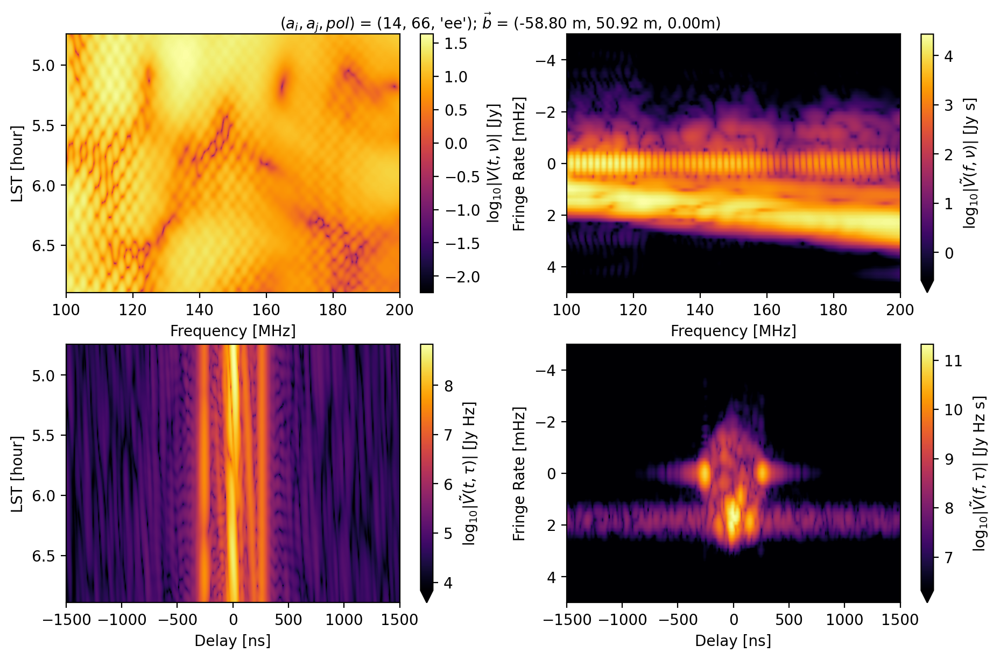

In [36]:
fig = fourier_transform_waterfalls(sim_uvd, **waterfall_kwargs)

**Figure 3 |** Raw visibility data containing foregrounds (eGSM + GLEAM + Brights) and 1/$k^2$ EoR. *Top Left*: Visibility in time/frequency space. *Top Right*: Visibility in fringe-rate/frequency space. *Bottom Left*: Visibility in time/delay space. *Bottom Right*: Visibility in fringe-rate/delay space. Note the bright foreground peak at zero delay and the pitchfork at the geometric horizon and zero fringe-rate.

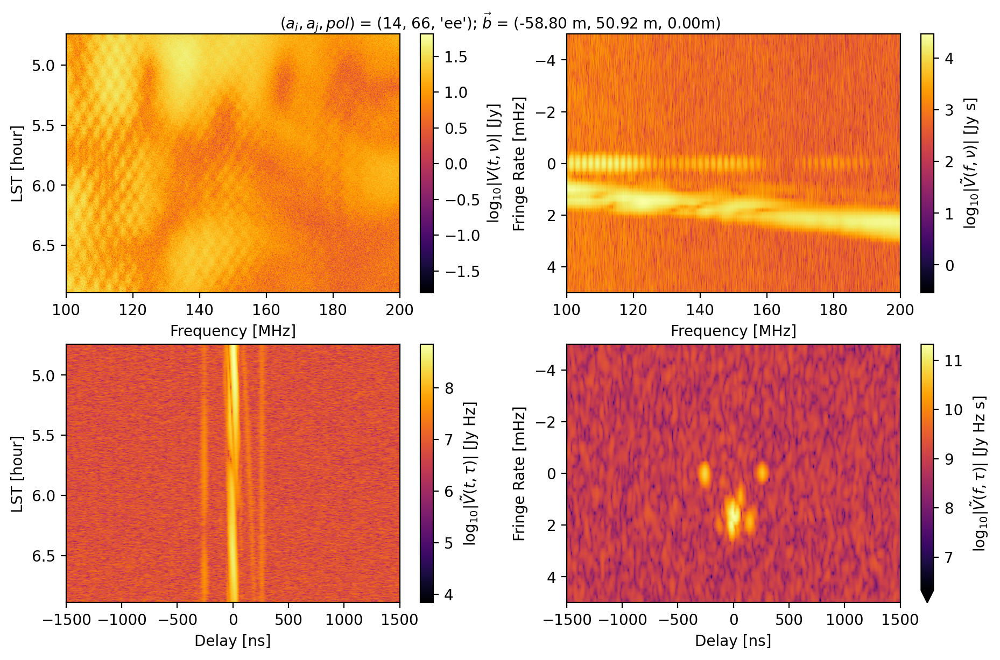

In [37]:
# add some noise
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd = tools.sim_prep.add_noise(corrupt_sim_uvd, ret_cmp=False)
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 4 |** Same as Figure 3, but with noise added according to the radiometer equation.

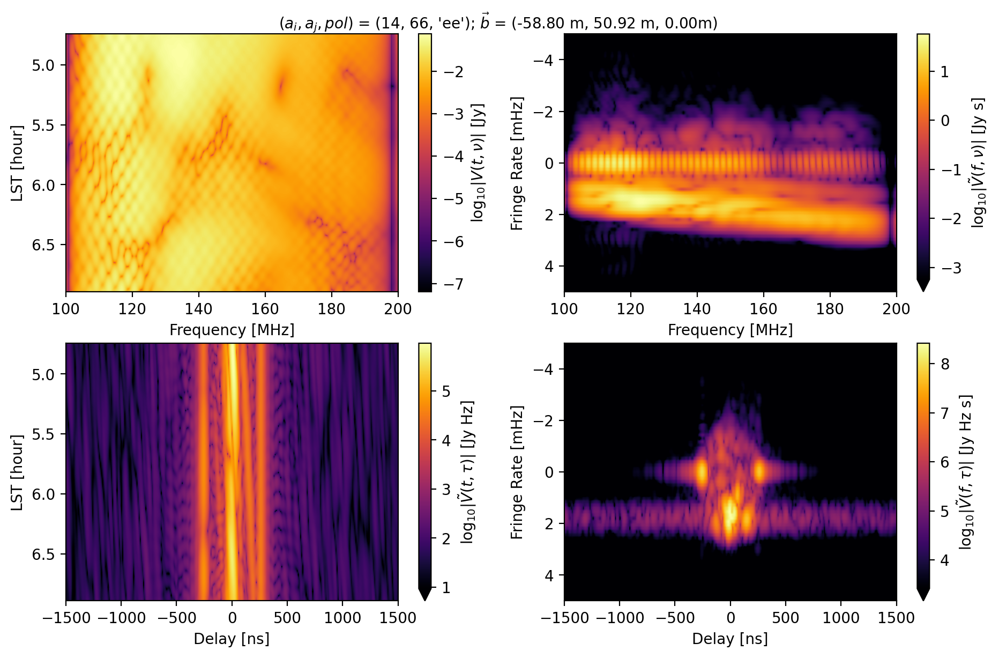

In [38]:
# add bandpass gains
with open(config_files[0], 'r') as cfg:
    config = yaml.load(cfg.read(), Loader=yaml.FullLoader)
freqs_GHz = np.unique(sim_uvd.freq_array) / 1e9
times = np.unique(sim_uvd.time_array)
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd, gains = tools.sim_prep.add_gains(
    corrupt_sim_uvd, **config["gains"]
)
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 5 |** Same as Figure 3, but with bandpass gains applied. The bandpass gains simulated here are generated using a polynomial fit to the H1C bandpass, with small per-antenna variation.

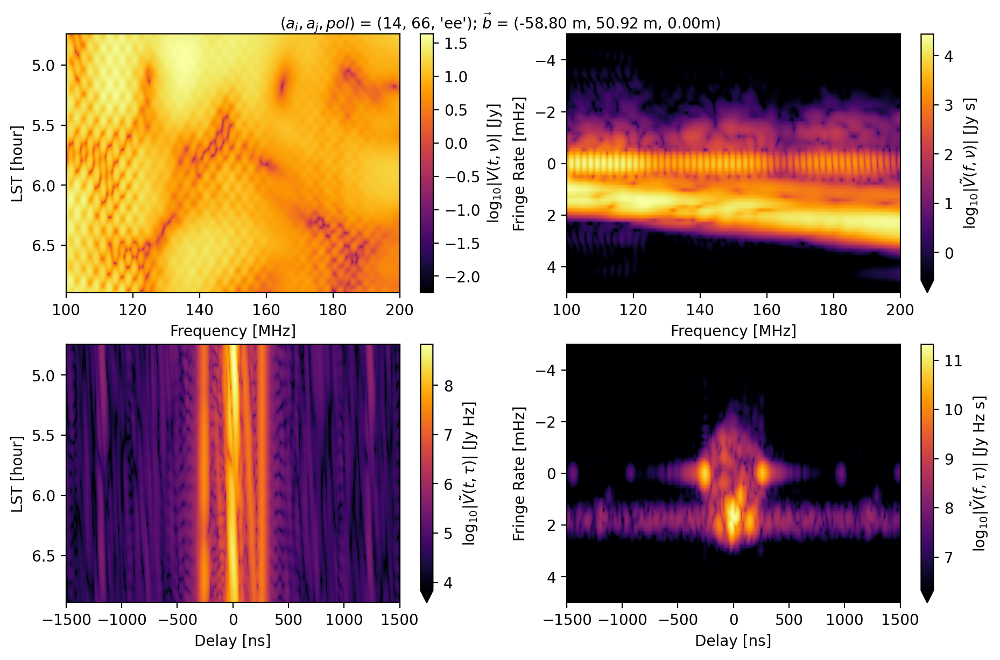

In [39]:
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd = tools.sim_prep.add_reflections(
    corrupt_sim_uvd, dly_spread=30, amp_scale=1e-4, ret_cmp=False
)
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 6 |** Same as Figure 3, but with a 1200 ns cable reflection. This is easiest to spot in the time/delay plot, but also relatively easy to notice in the fringe-rate/delay plot.

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


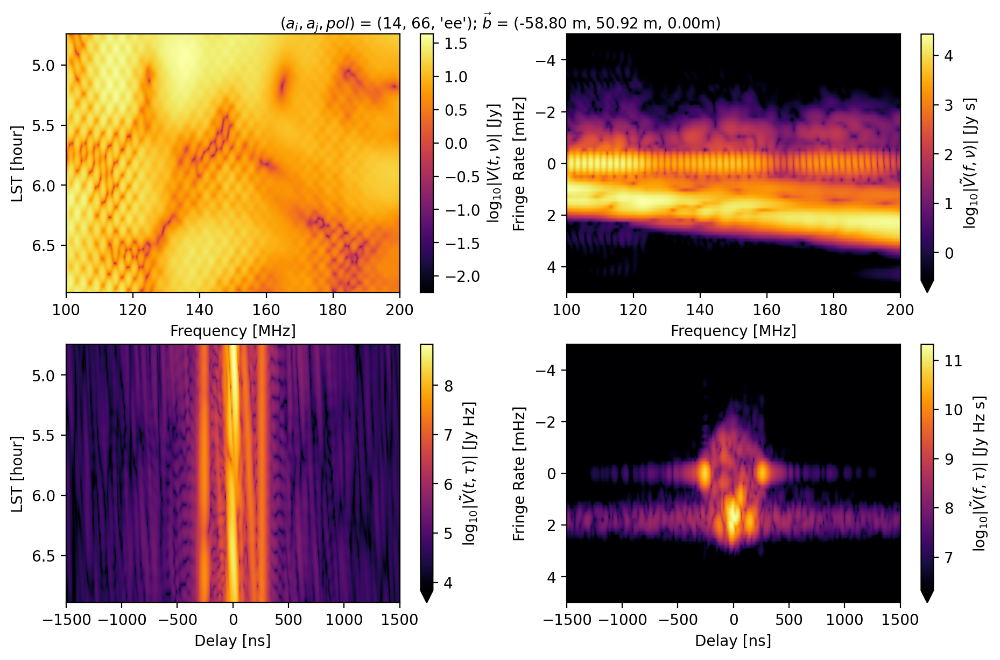

In [40]:
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd, reflections = tools.sim_prep.add_reflection_spectrum(
    corrupt_sim_uvd, **config["reflection_spectrum"]
)
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 7 |** Same as Figure 3, but with 20 reflections from 200 ns to 1000 ns added.

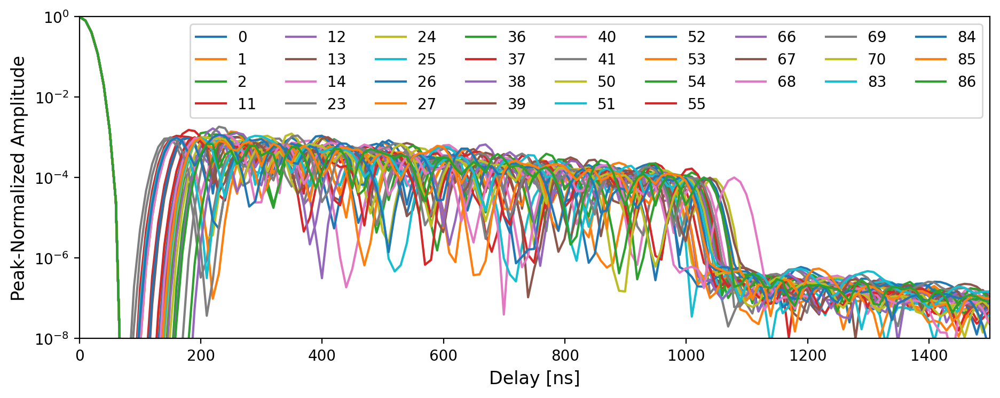

In [41]:
delays = fourier_freqs(np.unique(sim_uvd.freq_array)) * 1e9
fig = plt.figure(figsize=(11,4), dpi=200)
ax = fig.add_subplot(111)
ax.set_xlabel("Delay [ns]", fontsize=12)
ax.set_ylabel("Peak-Normalized Amplitude", fontsize=12)
ax.set_xlim(0, 1500)
ax.set_ylim(1e-8, 1)
for ant, reflection in reflections.items():
    spectrum = np.abs(FFT(reflection, axis=0, taper="bh7"))
    ax.semilogy(delays, spectrum / spectrum.max(), label=ant)
ax.legend(ncol=9, loc="upper right");

**Figure 8 |** Reflection shoulder for every antenna. Reflection amplitudes vary by about 1% between antennas, and reflection delays vary by about 30 ns between antennas.

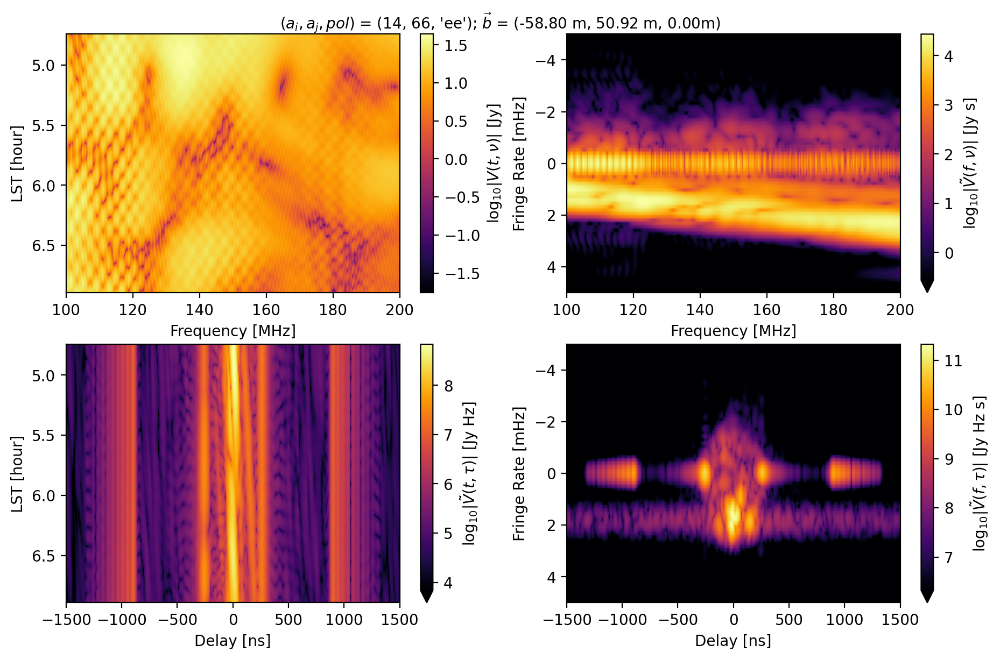

In [42]:
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd = tools.sim_prep.add_xtalk(corrupt_sim_uvd, ret_cmp=False)
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 9 |** Same as Figure 3, but with a cross-coupling systematic applied over a range of delays from about 900 ns to 1300 ns. Note that this is difficult to distinguish from cable reflections in the time/delay plot, but is clearly different from cable reflections in the fringe-rate/delay plot (cross-coupling does not fringe, while cable reflections do fringe).

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


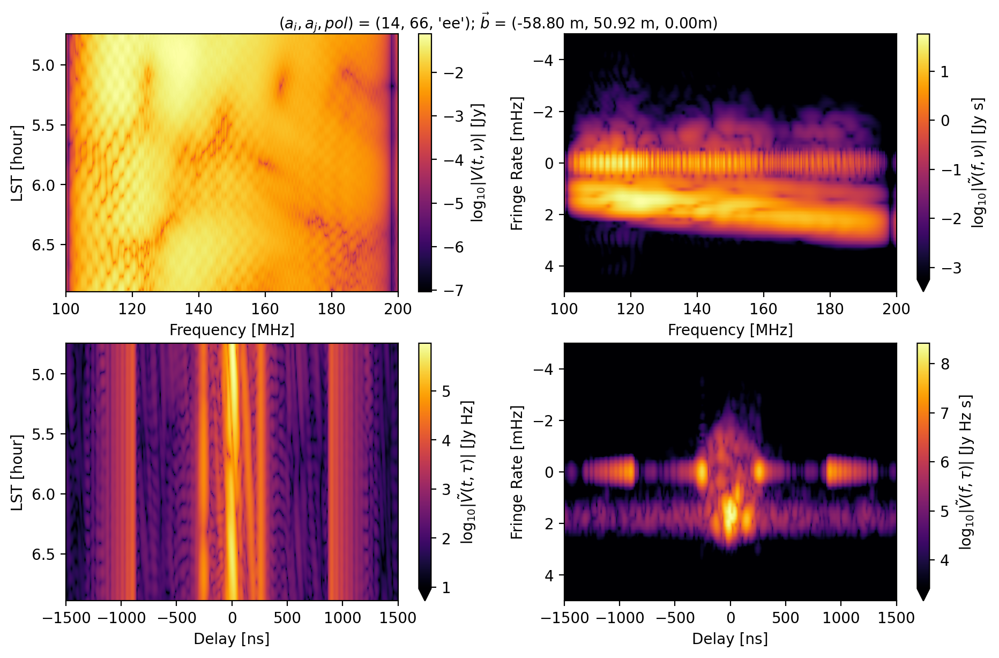

In [43]:
noise_params = config.pop("noise", {})  # Want to show all systematics simultaneously modulo noise
corrupt_sim_uvd = sim_uvd.copy()
corrupt_sim_uvd.select(antenna_nums=use_antpairpol[:-1])
corrupt_sim_uvd = tools.sim_prep.apply_systematics(
    corrupt_sim_uvd, **config
)[0]
fig = fourier_transform_waterfalls(corrupt_sim_uvd, **waterfall_kwargs)

**Figure 10 |** Visibilities with all of the effects shown in Figures 5, 6, 7, and 9 applied. The presence of bandpass gains are evident from the nulls at the band edges in the time/frequency plot. The cross-coupling is easily identified as the bright contributions at low fringe-rate and high delay. The reflection shoulder is a bit harder to spot, but careful inspection will reveal that the modes typically dominated by EoR are somewhat brighter than they are in the absence of reflections. (In a more realistic case, the EoR signal will not be so bright, and so the increased power at EoR-dominated modes will be more apparent.) Although not shown above, the reflections are much easier to spot in the autocorrelations (since cross-coupling is strongly suppressed in the autocorrelations).

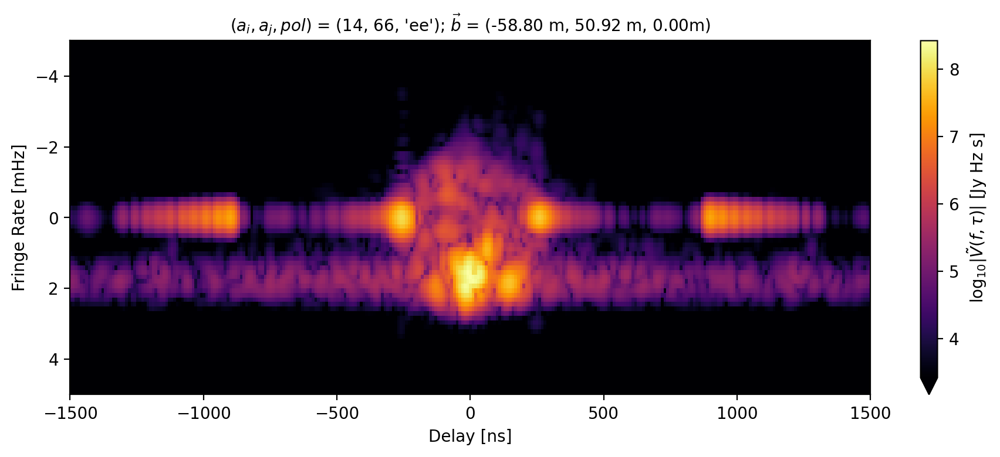

In [44]:
waterfall_kwargs["freqs"] = np.unique(sim_uvd.freq_array)
waterfall_kwargs["times"] = np.unique(sim_uvd.time_array)
waterfall_kwargs["dynamic_range"] = 5
waterfall_kwargs["fft_axis"] = "both"
waterfall_kwargs["figsize"] = (11,4)
waterfall_kwargs["antpairpol"] = use_antpairpol
_ = waterfall_kwargs.pop("plot_limits", None)
fig, ax = labeled_waterfall(
    corrupt_sim_uvd.get_data(use_antpairpol), **waterfall_kwargs
)
ax.set_xlim(min_dly, max_dly)
ax.set_ylim(max_fr, min_fr);

**Figure 11 |** Original visibility with all systematics except noise applied, shown in fringe-rate/delay space.

In [45]:
del sim_uvd, corrupt_sim_uvd

In [46]:
data_lst_cut = np.array([1,2.7]) * units.hr.to("day") * units.cycle.to("rad")
data_spw = np.arange(515,696)

# Figure out which times to load based on the LST cut.
sim_metadata = UVData()
sim_metadata.read(true_files[0], read_data=False, axis="blt")
times = np.unique(sim_metadata.time_array)
lsts = np.unique(sim_metadata.lst_array)
lst_to_time_interp = interp1d(lsts, times, kind="linear", fill_value="extrapolate")
select_times = list(lst_to_time_interp(lst) for lst in data_lst_cut)

dt = np.mean(sim_metadata.integration_time) * units.s.to("day")
dlst = np.mean(np.diff(lsts))
Nint = sim_metadata.Ntimes
file_dt = Nint * dt
file_dlst = Nint * dlst
del sim_metadata

Telescope RIMEz calculation is not in known_telescopes.


In [47]:
# Do an initial downselect on files for speed.
jd_pattern = re.compile("[0-9]{7}.[0-9]{5}")
select_files = [
    f for f in true_files
    if float(jd_pattern.findall(f)[0]) >= select_times[0]
    and float(jd_pattern.findall(f)[0]) + file_dt <= select_times[-1]
]

# Load the simlulation data.
sim_uvd = UVData()
sim_uvd.read(select_files, axis="blt", freq_chans=data_spw)

# Apply some systematics.
with open(config_files[0], "r") as cfg:
    config = yaml.load(cfg.read(), Loader=yaml.FullLoader)
_ = config.pop("gains")
sim_uvd = tools.sim_prep.apply_systematics(sim_uvd, **config)[0]

In [48]:
# Retrieve the in-painted real data files and load them.
lst_pattern = re.compile("[0-9].[0-9]{5}")
ref_data_path = idr2path / "IDR2_2_pspec/v2/one_group/data"
ref_data_files = sorted(
    glob.glob(str(ref_data_path / "*.OCRSLP2.uvh5"))
)
ref_data_files = [
    f for f in ref_data_files
    if float(lst_pattern.findall(f)[0]) >= data_lst_cut[0]
    and float(lst_pattern.findall(f)[0]) + file_dlst * 2 <= data_lst_cut[-1]
]  # Don't need to find a new file_dt since the sim files are matched to the data.
ref_uvd = UVData()
ref_uvd.read(ref_data_files, axis="blt", freq_chans=data_spw)

In [49]:
pos, ants = ref_uvd.get_ENU_antpos()
antpos = dict(zip(ants, pos))
bls = {
    (ai,aj): antpos[aj] - antpos[ai]
    for ai, aj in ref_uvd.get_antpairs()
}
antpairs = np.array(list(bls.keys()))
bl_vecs = np.array(list(bls.values()))
antpairpols = [
    antpairpol for antpairpol in sim_uvd.get_antpairpols()
    if antpairpol[0] != antpairpol[1]
]

all_flagged = True
while all_flagged:
    use_antpairpol = antpairpols[np.random.randint(len(antpairpols))]
    ai, aj, pol = use_antpairpol
    # check out the orientation of the baseline
    baseline = sim_antpos[aj] - sim_antpos[ai]
    blx = baseline[0]
    if blx > -30: continue

    # Find the corresponding baseline in the reference data
    bl_len = np.linalg.norm(baseline)
    angle = np.arctan2(*baseline[:-1][::-1])
    antpairpol = tuple(
        antpairs[list(np.allclose(bl, baseline, atol=1) for bl in bl_vecs).index(True)]
    ) + (use_antpairpol[-1],)
    all_flagged = np.all(ref_uvd.get_flags(antpairpol))
    

In [50]:
waterfall_kwargs = dict(
    set_title=False,
    mode="log",
    figsize=(11,5),
    dpi=200,
    dynamic_range={"fringe-rate": 5, "delay": 5},
    plot_units={"fringe-rate": "mHz", "delay": "ns"},
    plot_limits={"fringe-rate": (5, -5), "delay": (-1500, 1500)},
    freq_taper="bh7",
    time_taper="bh7",
)

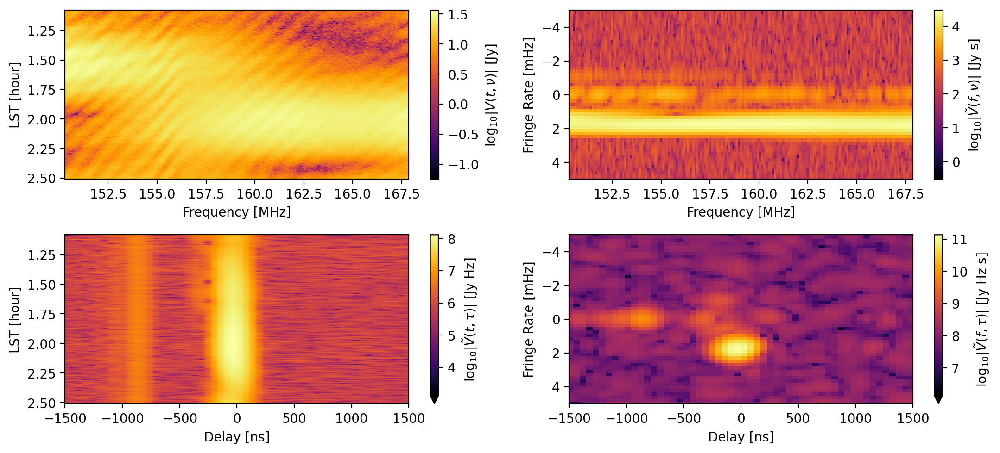

In [51]:
fig = fourier_transform_waterfalls(ref_uvd, antpairpol=antpairpol, **waterfall_kwargs)
fig.tight_layout()
filename = "/users/rpascua/plots/validation/test-4.0.0/data_fourier_transforms.pdf"
savefig = False
if savefig:
    fig.savefig(filename, dpi=200, bbox_inches="tight")
    fig.savefig(filename.replace(".pdf", ".png"), dpi=200, bbox_inches="tight")

**Figure 12 |** Data from the H1C observing season that has been redundantly and absolutely calibrated, smoothed, LST-binned , and in-painted. The time resolution is half that of the corresponding simulated data (so roughly 22 second integrations instead of 11 second integrations). A downselection has been performed on the data to only keep LSTs and frequencies that are a subset of the data cuts made in the H1C upper-limits analysis.

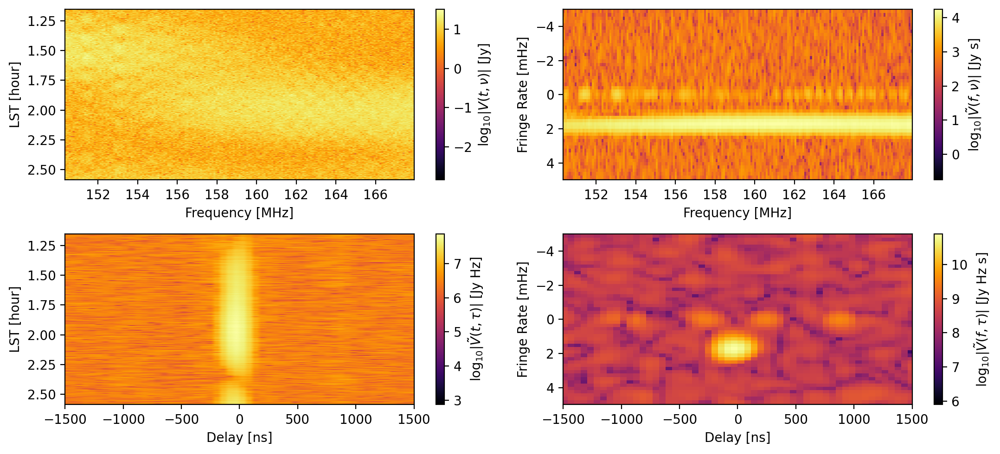

In [52]:
fig = fourier_transform_waterfalls(sim_uvd, antpairpol=use_antpairpol, **waterfall_kwargs)
fig.tight_layout()
filename = "/users/rpascua/plots/validation/test-4.0.0/simulation_fourier_transforms.pdf"
savefig = False
if savefig:
    fig.savefig(filename, dpi=200, bbox_inches="tight")
    fig.savefig(filename.replace(".pdf", ".png"), dpi=200, bbox_inches="tight")

**Figure 13 |** Simulated data for the same baseline and spectral window, and roughly the same LST range as that used for the observational data plotted above. The simulated data has all of the systematics included in this test, except bandpass gains.

In [53]:
del sim_uvd, ref_uvd

In [54]:
eor_files = sorted(
    glob.glob(os.path.join(vis_path / '2458098', "zen.*.eor.true.uvh5"))
)
fg_files = sorted(
    glob.glob(os.path.join(vis_path / '2458098', "zen.*.foregrounds.true.uvh5"))
)
use_slice = slice(5, 25)
ai, aj, pol = use_antpairpol
use_bls = [(ai,ai,pol), (aj,aj,pol), (ai,aj,pol)]

In [55]:
sum_uvd = UVData()
sum_uvd.read(true_files[use_slice], bls=use_bls, axis="blt")

In [56]:
eor_uvd = UVData()
eor_uvd.read(eor_files[use_slice], bls=use_bls, axis="blt")

In [57]:
fg_uvd = UVData()
fg_uvd.read(fg_files[use_slice], bls=use_bls, axis="blt")

In [58]:
param_aliases = {
    "Cable Reflections": "reflections",
    "Mutual Coupling": "reflection_spectrum",
    "Cross-Coupling": "xtalk",
}

In [59]:
_ = config.pop("noise", None)

In [60]:
data_products = {"EoR": eor_uvd, "Foregrounds": fg_uvd}
refl_data = sum_uvd.copy()
refl_data = tools.sim_prep.add_reflections(
    refl_data, ret_cmp=False, **config["reflections"]
)
refl_data = tools.sim_prep.add_reflection_spectrum(
    refl_data, ret_cmp=False, **config["reflection_spectrum"]
)
data_products["Cable Reflections"] = refl_data
data_products["Cross-Coupling"] = tools.sim_prep.add_xtalk(
    sum_uvd.copy(), ret_cmp=False, **config["xtalk"]
)
    
all_effects_key = " + ".join(data_products.keys())
corrupt_data = sum_uvd.copy()
corrupt_data, systematics, params = tools.sim_prep.apply_systematics(
    corrupt_data, return_systematics=True, **config
)
data_products[all_effects_key] = corrupt_data

In [61]:
true_sum_data = eor_uvd.get_data(use_antpairpol) + fg_uvd.get_data(use_antpairpol)
df = np.mean(eor_uvd.channel_width)
dt = np.mean(eor_uvd.integration_time)
vmax = np.log10(
    np.abs(
        FFT(FFT(true_sum_data, axis=0, taper="bh7"), axis=1, taper="bh7")
    ).max() * df * dt
)

In [62]:
fr_bounds = (3.1, -3.1)
dly_bounds = (-1500, 1500)
waterfall_kwargs = dict(
    freqs=np.unique(sum_uvd.freq_array),
    times=np.unique(sum_uvd.time_array),
    set_title=False,
    dynamic_range=5.5,
    vmax=vmax,
    fft_axis="both",
    freq_taper="bh7",
    time_taper="bh7",
)

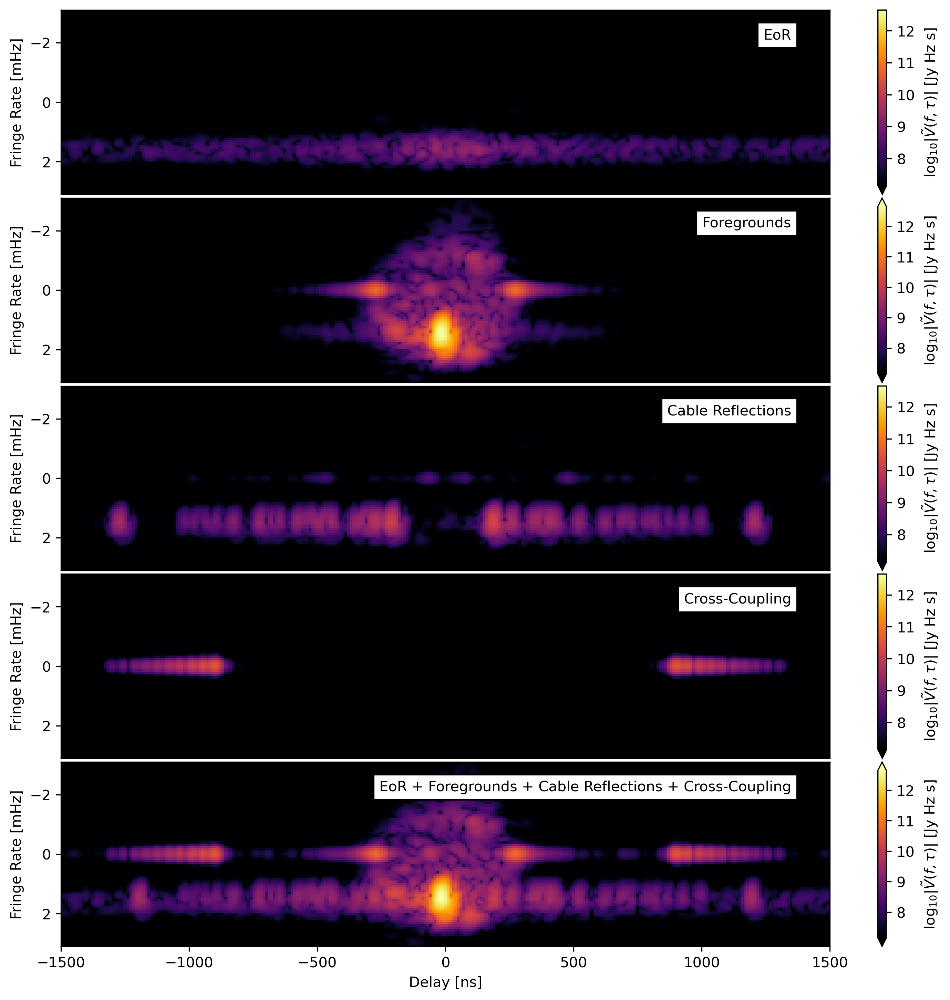

In [63]:
dpi = 300
fig = plt.figure(figsize=(12,12), dpi=dpi)
axes = fig.subplots(5, gridspec_kw={"hspace": 0.02})
for ax in axes.ravel():
    if ax is axes[-1]:
        ax.set_xlabel("Delay [ns]", fontsize=12)
    else:
        ax.xaxis.set_visible(False)
    ax.set_ylabel("Fringe Rate [mHz]")
    
for row, label in enumerate(data_products.keys()):
    sum_data = data_products[label].get_data(use_antpairpol)
    if row in (0, 1, len(axes) - 1):
        residual_data = sum_data
    else:
        residual_data = sum_data - true_sum_data
    ax = axes[row]
    _ = labeled_waterfall(residual_data, ax=ax, **waterfall_kwargs)
    ax.set_xlim(*dly_bounds)
    ax.set_ylim(*fr_bounds)
    ax.text(
        0.95,
        0.9,
        label,
        bbox=dict(facecolor="white", alpha=1),
        transform=ax.transAxes,
        horizontalalignment="right",
        verticalalignment="top",
    )
    
filename = "/users/rpascua/plots/validation/test-4.0.0/systematics_progression_v2.pdf"
savefig = False
if savefig:
    fig.savefig(filename, dpi=dpi, bbox_inches="tight")
    fig.savefig(filename.replace(".pdf", ".png"), dpi=dpi, bbox_inches="tight")

**Figure 14 |** Collection of plots showing the various interesting simulation components (i.e. components that add new, interesting structure in either fringe-rate or delay; bandpass gains are omitted since they just get convolved with the original signal when plotted in delay space).